<a href="https://colab.research.google.com/github/cagBRT/computer-vision/blob/master/CV6_ObjectRecognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Clone the entire repo.
!git clone -l -s https://github.com/cagBRT/computer-vision.git cloned-repo
%cd cloned-repo

Cloning into 'cloned-repo'...
remote: Enumerating objects: 3887, done.
remote: Counting objects: 100% (198/198), done.
remote: Compressing objects: 100% (139/139), done.
remote: Total 3887 (delta 108), reused 106 (delta 59), pack-reused 3689
Receiving objects: 100% (3887/3887), 424.76 MiB | 22.25 MiB/s, done.
Resolving deltas: 100% (1443/1443), done.
Updating files: 100% (2300/2300), done.
/content/cloned-repo


**Import the required libraries and check for GPUs**

In [2]:
# For running inference on the TF-Hub module.
import tensorflow as tf
import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
import cv2
from google.colab.patches import cv2_imshow

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.14.0
The following GPU devices are available: /device:GPU:0


# **Faster R-CNN with Inception Resnet v2**
With the rise of autonomous vehicles, smart video surveillance, facial detection and various people counting applications, fast and accurate object detection systems are rising in demand. These systems involve not only recognizing and classifying every object in an image, but localizing each one by drawing the appropriate bounding box around it. This makes object detection a significantly harder task than its traditional computer vision predecessor, image classification.<bR>
This notebook uses the Faster RCNN with Inception Resnet v2 to perform object detection.<br>

*R-CNN == "Regions with CNN Features" or "Region Based CNN"

Faster R-CNN may not be the simplest or fastest method for object detection, but it is still one of the best performing. Case in point, **Tensorflow’s Faster R-CNN with Inception ResNet is their slowest but most accurate model**.

Object detection API for Tensorflow has pre-built architectures and weights for a few specific models:<br>
- Single Shot Multibox Detector (SSD) with MobileNets<br>
- SSD with Inception V2<br>
- Region-Based Fully Convolutional Networks (R-FCN) with Resnet 101<br>
- Faster RCNN with Resnet 101<br>
- Faster RCNN with Inception Resnet v2<br>

# **R-CNN Modules**<br>
R-CNN model is comprised of three modules:<br>

- Module 1: Region Proposal. Generate and extract category independent region proposals, e.g. candidate bounding boxes.
- Module 2: Feature Extractor. Extract feature from each candidate region, e.g. using a deep convolutional neural network.
- Module 3: Classifier. Classify features as one of the known class, e.g. linear SVM classifier model.


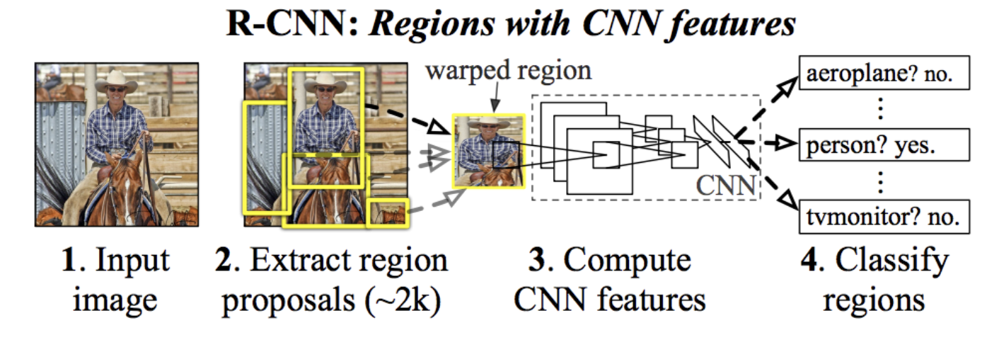

In [3]:
image = cv2.imread("images/R-CNN.png")
cv2_imshow(image)

# **Fast R-CNN**
The architecture of the Fast R-CNN model accepts the photograph as a set of region proposals as input that are passed through a deep convolutional neural network. A pre-trained CNN, such as a VGG-16, is used for feature extraction. The end of the deep CNN is a custom layer called a Region of Interest Pooling Layer, or **RoI Pooling**, that extracts features specific for a given input candidate region.

The output of the CNN is then interpreted by a fully connected layer then the model bifurcates into two outputs, one for the class prediction via a softmax layer, and another with a linear output for the bounding box. This process is then repeated multiple times for each region of interest in a given image.

The model is significantly faster to train and to make predictions, yet still requires a set of candidate regions to be proposed along with each input image.


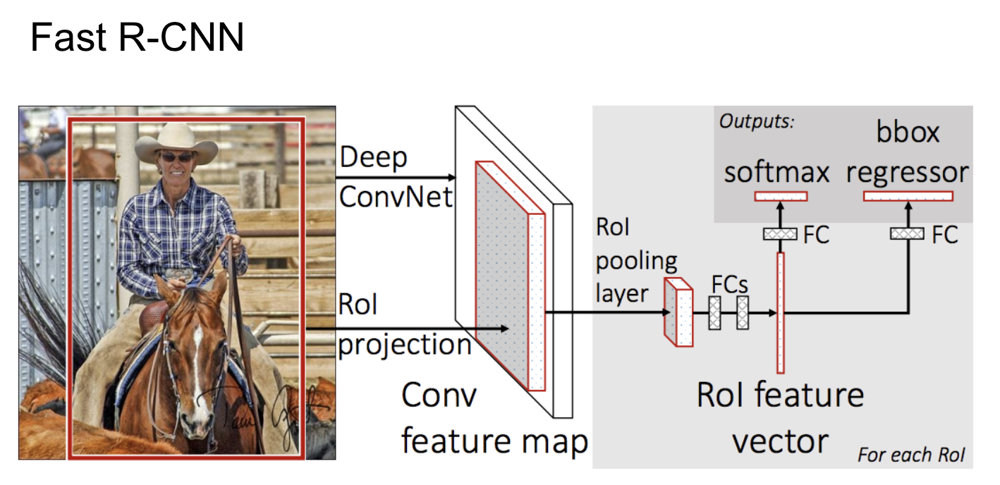

In [4]:
image = cv2.imread("images/FasterRCNN.png")
cv2_imshow(image)

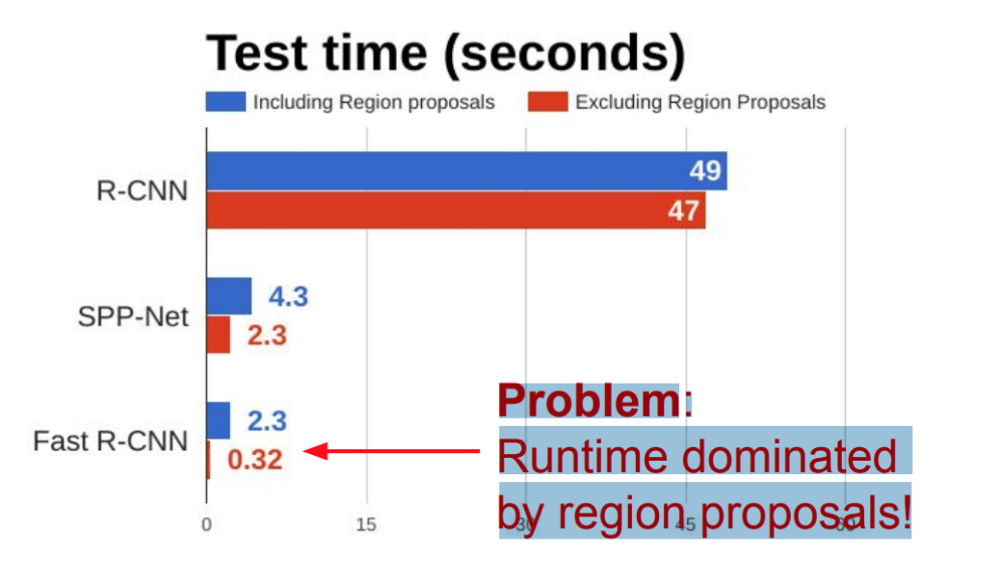

In [5]:
image = cv2.imread("images/comparisonCNNs.png")
cv2_imshow(image)

# **Faster CNNs**
Faster CNNs have 3 parts:<br>
1. Convolution layers - similiar to VGG-16
2. Region Proposal Network (RPN)
3. Classes and Bounding Boxes prediction - a fully connected NN to predict the classes and bounding boxes

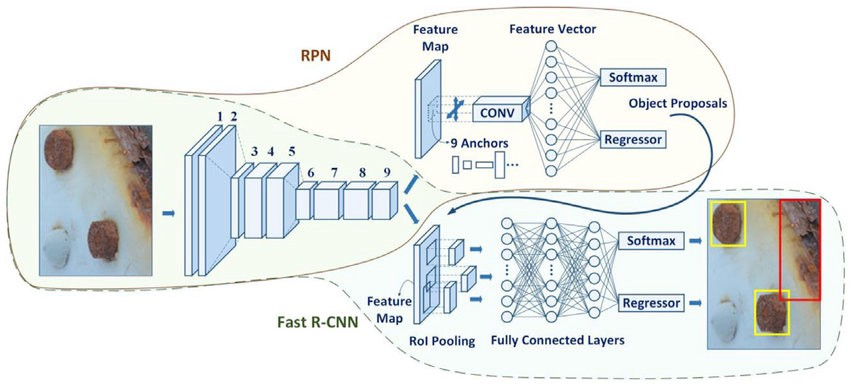

In [6]:
image = cv2.imread("images/FasterCNNparts.png")
cv2_imshow(image)

**RPN**<br>
The RPN is a small neural network that uses anchor boxes to predict whether there is an object or not and then predict the bounding box of those objects.

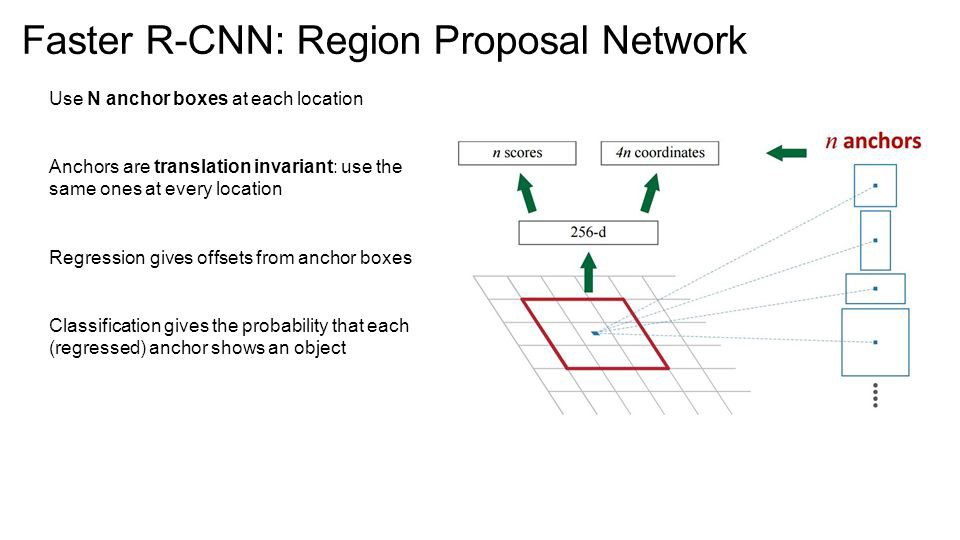

In [7]:
image = cv2.imread("images/RegionProposalNetwork.jpeg")
cv2_imshow(image)

https://www.tensorflow.org/hub/tutorials/object_detection


**Helper functions for working with the images**

In [8]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

**Get and resize the image**

<ipython-input-8-45867cb33167>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to /tmp/tmpdyr1osni.jpg.


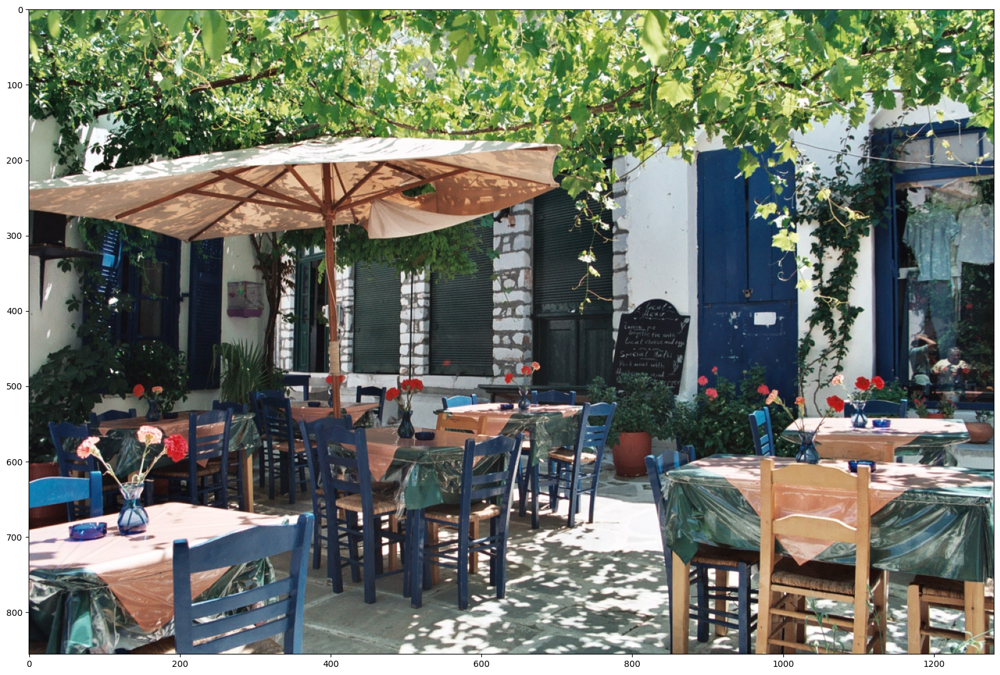

In [9]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

**FasterRCNN+InceptionResNetv2**<br>
The model used for this notebook is FasterRCNN+InceptionResNetv2<br>
<br>
In the image below: <br>
- x axis is time
- y axis is the accuracy

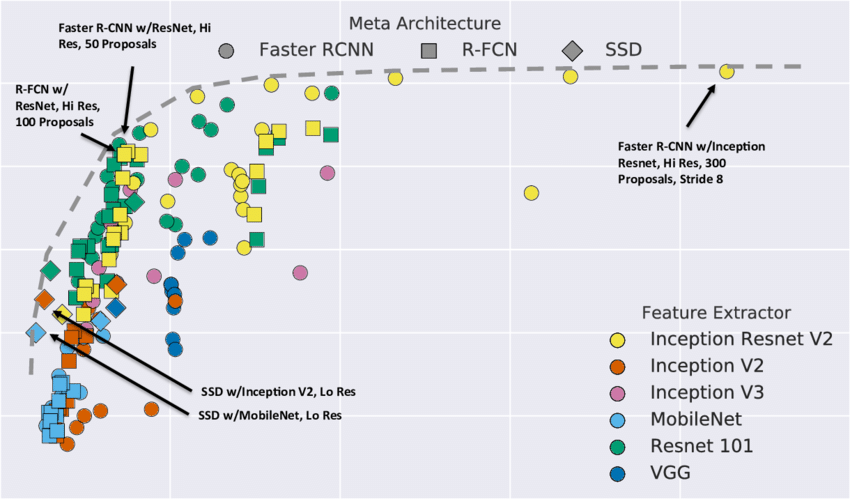

In [10]:
image = cv2.imread("images/Accuracy-vs-time-with-marker-shapes-indicating-meta-architecture-and-colors-indicating.png")
cv2_imshow(image)

In [11]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

The image below is the Inception ResNet v2 architecture

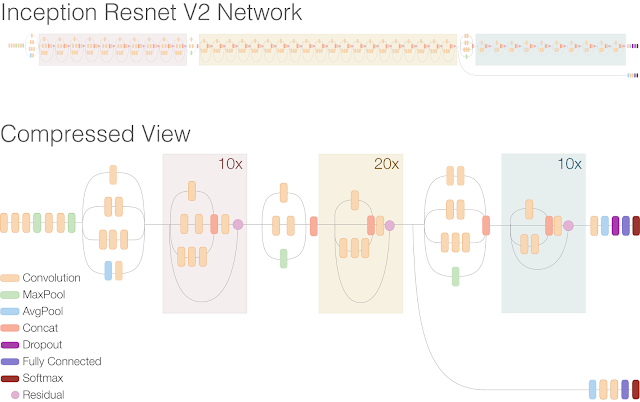

In [12]:
image = cv2.imread("images/inceptionResNetV2.png")
cv2_imshow(image)

In [13]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img


In [14]:
import pandas as pd

def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  ds1 = pd.Series(data=result["detection_scores"])
  ds2 = pd.Series(result["detection_class_labels"])
  ds3 = pd.Series(result["detection_class_entities"])
  frame = {'Scores':ds1,'Labels':ds2, "Class":ds3}
  df = pd.DataFrame(frame)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)
  return df

Found 100 objects.
Inference time:  57.844820499420166


<ipython-input-8-45867cb33167>:45: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-8-45867cb33167>:55: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


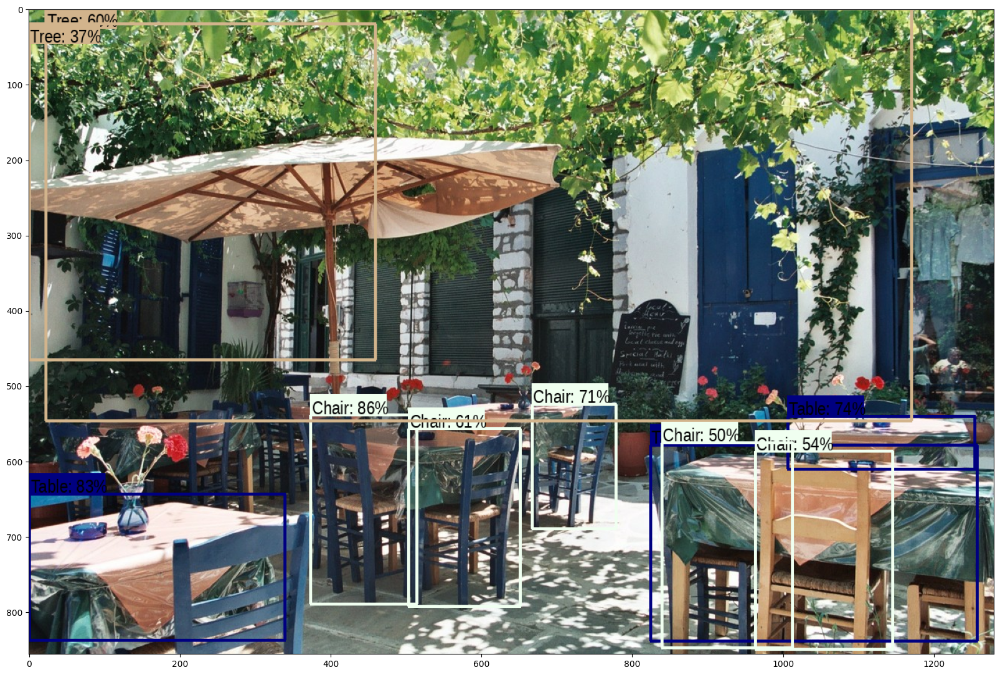

In [15]:
dataframe = run_detector(detector, downloaded_image_path)

In [16]:
import pandas as pd
import numpy as np

dataframe.head(15)

,Scores,Labels,Class
0,0.863040,97,b'Chair'
1,0.836557,281,b'Table'
2,0.749910,281,b'Table'
3,0.714518,97,b'Chair'
4,0.641925,281,b'Table'
5,0.619824,97,b'Chair'
6,0.605356,391,b'Tree'
7,0.544299,97,b'Chair'
8,0.500876,97,b'Chair'
9,0.376776,391,b'Tree'


In [17]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 480)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Inference time:",end_time-start_time)

<ipython-input-8-45867cb33167>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to /tmp/tmpwjxe_sop.jpg.
Found 100 objects.
Inference time:  2.9545674324035645
Inference time: 3.210812568664551


<ipython-input-8-45867cb33167>:45: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-8-45867cb33167>:55: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


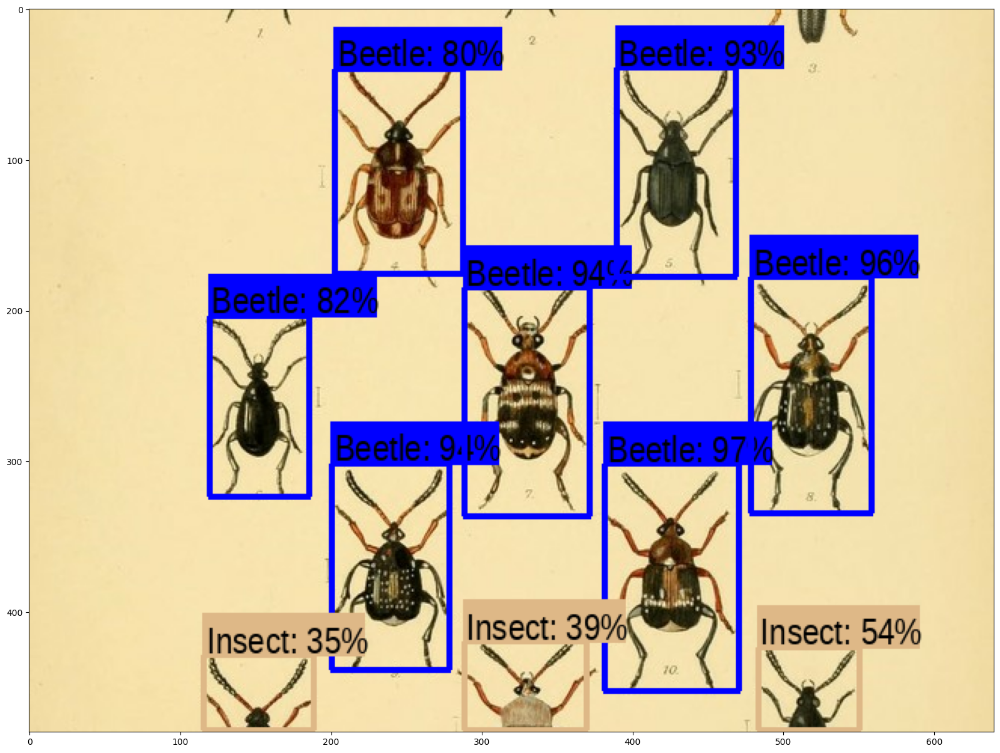

In [18]:
detect_img(image_urls[0])

<ipython-input-8-45867cb33167>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to /tmp/tmp1cq1ume5.jpg.
Found 100 objects.
Inference time:  1.370208740234375
Inference time: 1.6894562244415283


<ipython-input-8-45867cb33167>:45: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-8-45867cb33167>:55: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


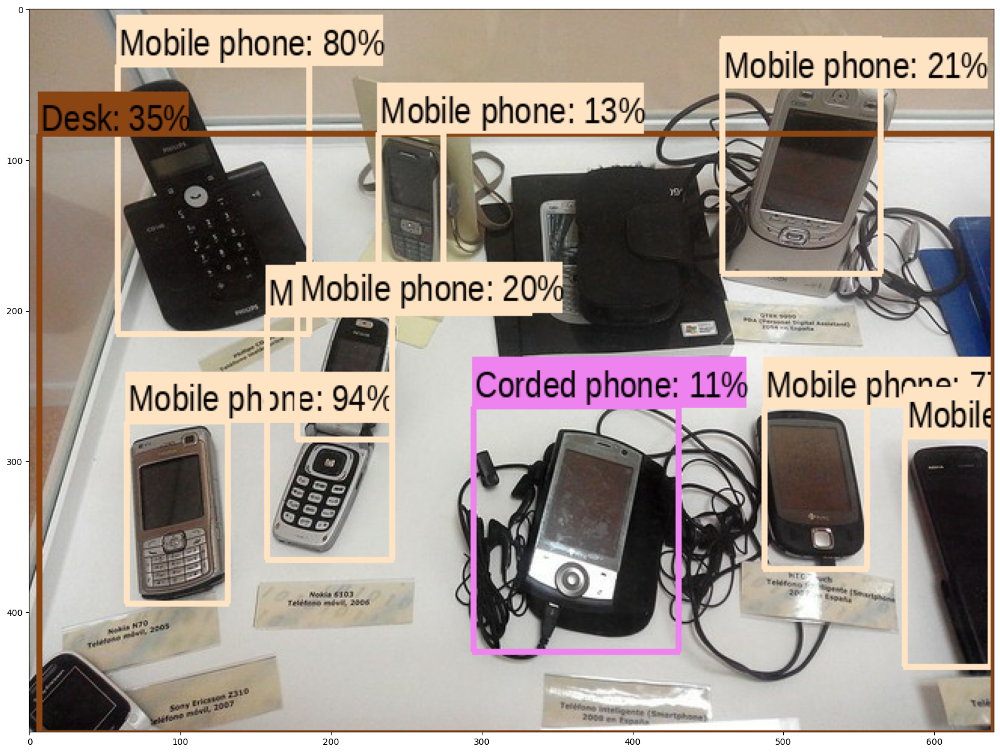

In [19]:
detect_img(image_urls[1])

<ipython-input-8-45867cb33167>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to /tmp/tmpck2_6kgc.jpg.
Found 100 objects.
Inference time:  1.128037929534912
Inference time: 1.4526402950286865


<ipython-input-8-45867cb33167>:45: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-8-45867cb33167>:55: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


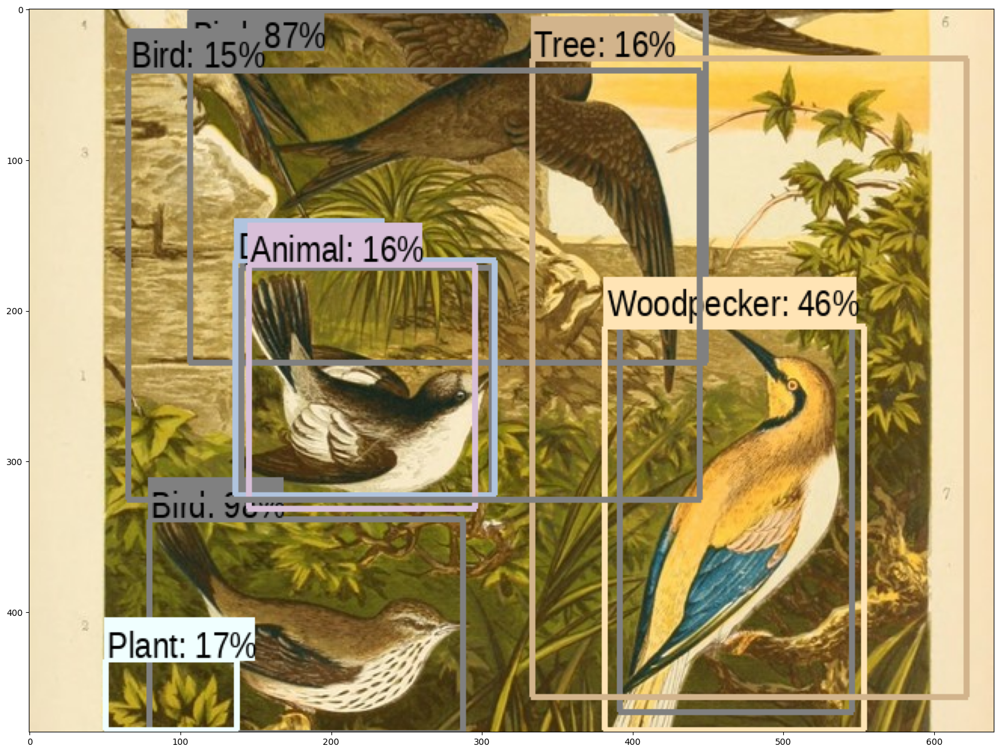

In [20]:
detect_img(image_urls[2])

# **Assignment**
Find a photo on the internet<br>
Upload it to the CoLab file system<br>
Use the model to do object recognition on the photo